# Markov Process in Finance - Credit Rating

## 1. Introduction

<p style='text-align: justify;'>
The objective for this project is to analyze the credit ratings phenomenon. In the following section, we will explore the single notch and multiple notch migrations by companies and sectors. We will also observe the changes over time and how it is affected during a financial crisis. The data we use for our analysis is the North America S&P credit ratings monthly data from WRDS. 

Initial Setup to include dataframe package

In [1]:
using Pkg;
Pkg.add("DataFrames");

  Updating registry at `/home/jrun/.julia/registries/JuliaPro`
  Updating git-repo `https://pkg.juliacomputing.com/registry/JuliaPro`
Fetching: [========================================>]  100.0 %.0 %13.7 %>                             ]  27.4 %                  ]  54.7 %>               ]  60.2 %==============================>          ]  73.9 %]  87.5 % Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]


In [2]:
using DataFrames
using Dates
using Plots
using LinearAlgebra

In [3]:
using Printf
Base.show( io::IO, x::Float64) = @printf(io, "%0.4f", x)

## 2. Company (1987 ~ 2017)

<p style='text-align: justify;'>
For this section, we will discuss the single and multi notch and transition matrix based on the ticker name and company names with all time data. Unlike the third section, we create a new dataframe here. The reason why we restrcuture the dataframe is because we don't want to fall into a survival bias when we drop all missing values. 

### 2.1 Data Processing

In [4]:
raw_data = readtable("data.csv")
head(raw_data)

,gvkey,splticrm,datadate,gsector,conm,tic
,Int64⍰,String⍰,Int64⍰,Int64⍰,String⍰,String⍰
1,1003,missing,20040630,25,A.A. IMPORTING CO INC,ANTQ
2,1003,missing,20040731,25,A.A. IMPORTING CO INC,ANTQ
3,1003,missing,20040831,25,A.A. IMPORTING CO INC,ANTQ
4,1003,missing,20040930,25,A.A. IMPORTING CO INC,ANTQ
5,1003,missing,20041031,25,A.A. IMPORTING CO INC,ANTQ
6,1003,missing,20041130,25,A.A. IMPORTING CO INC,ANTQ


In [5]:
data = dropmissing(raw_data)
head(data)

,gvkey,splticrm,datadate,gsector,conm,tic
,Int64⍰,String⍰,Int64⍰,Int64⍰,String⍰,String⍰
1,1004,BBB,19870531,20,AAR CORP,AIR
2,1004,BBB,19870630,20,AAR CORP,AIR
3,1004,BBB,19870731,20,AAR CORP,AIR
4,1004,BBB,19870831,20,AAR CORP,AIR
5,1004,BBB,19870930,20,AAR CORP,AIR
6,1004,BBB,19871031,20,AAR CORP,AIR


In [6]:
ticker = unique(data[:1])
ticker_name = unique(data[:6])

5947-element Array{Union{Missing, String},1}:
 "AIR"  
 "4165A"
 "5548C"
 "AGS.2"
 "ALO.2"
 "UDI." 
 "AEN.2"
 "AAL"  
 "4267A"
 "ASTA" 
 "ARXX" 
 "4328B"
 "AVX"  
 ⋮      
 "KRG"  
 "TAM.2"
 "ATBIF"
 "EVGPF"
 "PLZLY"
 "EXXIQ"
 "MODL" 
 "EC"   
 "CNHI" 
 "PACDD"
 "TAM"  
 "ALLE" 

<p style='text-align: justify;'>
We can easily find that now the time is from 1987 to 2017. The number of companies is now 5947 rather than 4987. In this section, we try to do the analysis in a different way. Here, we try to join all companies into one dataframe, where each columns shows the rating for each company. (Note that the process to join all companies will take a while)
</p>

In [7]:
all = DataFrame(datadate=0)
for itr in enumerate(ticker)
#     println(itr[2])
    temp1 = data[data[:1].==itr[2],:][2:3]
    all=join(all, temp1, on= :datadate, kind= :outer)
end

In [8]:
real_all = all[2:end,:]
sort!(real_all);
head(real_all)

6×5948 DataFrame. Omitted printing of 5943 columns
│ Row │ datadate │ splticrm │ splticrm_1 │ splticrm_2 │ splticrm_3 │
│     │ Int64⍰   │ String⍰  │ String⍰    │ String⍰    │ String⍰    │
├─────┼──────────┼──────────┼────────────┼────────────┼────────────┤
│ 1   │ 19810131 │ missing  │ missing    │ missing    │ missing    │
│ 2   │ 19810228 │ missing  │ missing    │ missing    │ missing    │
│ 3   │ 19810331 │ missing  │ missing    │ missing    │ missing    │
│ 4   │ 19810430 │ missing  │ missing    │ missing    │ missing    │
│ 5   │ 19810531 │ missing  │ missing    │ missing    │ missing    │
│ 6   │ 19810630 │ missing  │ missing    │ missing    │ missing    │

<p style='text-align: justify;'>
Next step, we try to convert string ratings to numerical ratings. Unlike the second section, we have a different scale here because the increasing data set. We've also create a dictionary of the numerical ratings for later analysis.

In [9]:
data=DataFrame()
ratingcount=zeros(22)
for j in 2:size(real_all)[2]
    temp=[]
    for k in 1:size(real_all)[1]
        if ismissing(real_all[j][k])
            append!(temp,-2)
        elseif real_all[j][k]=="AAA"
            append!(temp,23)
            ratingcount[22]+=1
        elseif real_all[j][k]=="AA+"
            append!(temp,22)
            ratingcount[21]+=1
        elseif real_all[j][k]=="AA"
            append!(temp,21)
            ratingcount[20]+=1
        elseif real_all[j][k]=="AA-"
            append!(temp,20)
            ratingcount[19]+=1
        elseif real_all[j][k]=="A+"
            append!(temp,19)
            ratingcount[18]+=1
        elseif real_all[j][k]=="A"
            append!(temp,18)
            ratingcount[17]+=1
        elseif real_all[j][k]=="A-"
            append!(temp,17)
            ratingcount[16]+=1
        elseif real_all[j][k]=="BBB+"
            append!(temp,16)
            ratingcount[15]+=1
        elseif real_all[j][k]=="BBB"
            append!(temp,15)
            ratingcount[14]+=1
        elseif real_all[j][k]=="BBB-"
            append!(temp,14)
            ratingcount[13]+=1
        elseif real_all[j][k]=="BB+"
            append!(temp,13)
            ratingcount[12]+=1
        elseif real_all[j][k]=="BB"
            append!(temp,12)
            ratingcount[11]+=1
        elseif real_all[j][k]=="BB-"
            append!(temp,11)
            ratingcount[10]+=1
        elseif real_all[j][k]=="B+"
            append!(temp,10)
            ratingcount[9]+=1
        elseif real_all[j][k]=="B"
            append!(temp,9)
            ratingcount[8]+=1
        elseif real_all[j][k]=="B-"
            append!(temp,8)
            ratingcount[7]+=1
        elseif real_all[j][k]=="CCC+"
            append!(temp,7)
            ratingcount[6]+=1
        elseif real_all[j][k]=="CCC"
            append!(temp,6)
            ratingcount[5]+=1
        elseif real_all[j][k]=="CCC-"
            append!(temp,5)
            ratingcount[4]+=1
        elseif real_all[j][k]=="CC"
            append!(temp,4)
            ratingcount[3]+=1
        elseif real_all[j][k]=="C"
            append!(temp,3)
            ratingcount[2]+=1
        elseif real_all[j][k]=="SD"
            append!(temp,2)
            ratingcount[1]+=1
        elseif real_all[j][k]=="D"
            append!(temp,2)
            ratingcount[1]+=1
        elseif real_all[j][k]=="N.M."
            append!(temp,0)    
        else
            append!(temp,0)
        end
    end
    data=hcat(data,temp)
end

In [10]:
ref_list = Dict("AAA"=>23,"AA+"=>22,"AA"=>21,"AA-"=>20,"A+"=>19,"A"=>18,"A-"=>17,
                "BBB+"=>16,"BBB"=>15,"BBB-"=>14,"BB+"=>13,"BB"=>12,"BB-"=>11,"B+"=>10,"B"=>9,"B-"=>8,
                "CCC+"=>7,"CCC"=>6,"CCC-"=>5,"CC"=>4,"C"=>3,"D"=>2,
                "NM"=>0,"missing"=>-2)
sort(ref_list)
all_ticks = DataFrame(ticker=ticker, tickername=ticker_name);

In [11]:
#creating the list of names of rating
sortlist = sort(collect(zip(values(ref_list),keys(ref_list))))
ratinglist = []
for i in 3:length(sortlist)
    ratinglist = vcat(ratinglist, sortlist[i][2])
end

In [12]:
ratingcounter = DataFrame(ratinglist = ratinglist, ratingcount=ratingcount)
sort(ratingcounter, :ratingcount, rev=true)

,ratinglist,ratingcount
,Any,Float64
1,BBB,75748.0000
2,B+,69567.0000
3,BBB+,61873.0000
4,BBB-,58117.0000
5,BB-,56913.0000
6,A,56752.0000
7,A-,52823.0000
8,BB,45194.0000
9,B,43433.0000


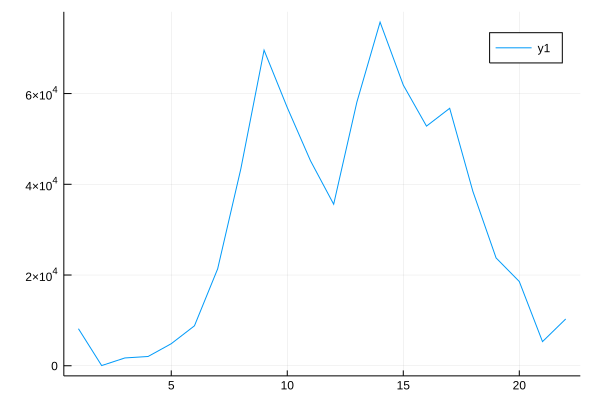

In [13]:
plot(ratingcounter.ratingcount)

<p style='text-align: justify;'>
We can find the number of each credit rating. The most credit rating in the data set is 75,748, which is BBB, and the least credit rating in the data set is 42, which is C. Then, we plot the distribution of the data set to have a easier check for each credit rating.

In [14]:
timeframe = DataFrame(Date=[])
for i in 1:size(real_all)[1]
    timeframe = vcat(timeframe, Dates.DateTime(string(real_all[i,1]),"yyyymmdd"))
end
timeframe = timeframe[2:end];

In [15]:
size(data)

(434, 5947)

### 2.2 Rating Change Graph Demonstration

<p style='text-align: justify;'>
For this part, we have two ways to plot credit ratings by using ticker names and the name of companies. By doing so, we can compare with each other to see how the changes occur for different company. Based on the new dataframe we use, we can have some default data set back, which can be seen in the graph we plot.

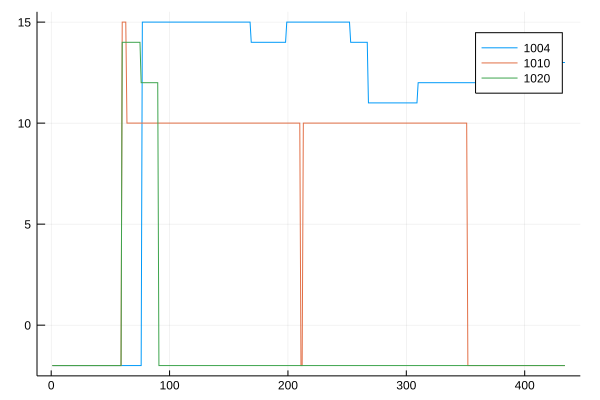

In [16]:
plot()
start = 1
en_d = 3
plot!([data[i] for i in start:en_d], label = [ticker[k] for k in start:en_d])

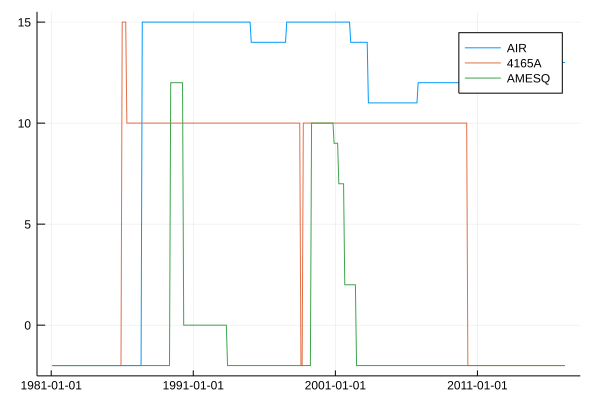

In [17]:
#plot using tick
wantick = ["AIR","4165A","AMESQ"]
ranges = []
for i in wantick
    append!(ranges, findall(all_ticks.tickername.==i))
end

plot()
plot!(timeframe,[data[i] for i in ranges],label=[all_ticks.tickername[k] for k in ranges])


### 2.3  Single Notch Tansitions, Multiple Notch Transitions Percentage

<p style='text-align: justify;'>
For this section, we will discuss about the single-notch and multi-notch percentage. We can find that the percentage of single notch percentage is 38.70% and the percentage of multi notch percentage 61.30%. Then, we can find the percentage of single and multi notch by using ticker names or companies name for a deeper discussion.  

In [18]:
sing_mult_notch=DataFrame(single=[],multi=[])
sing_percentage=[]
mult_percentage=[]
for j in 1:size(data)[2]
    notch=[0,0]
    for k in 1:size(data)[1]-1
        if abs(data[k,j]-data[k+1,j])==1
            if data[k,j]!=-1
                notch[1] = notch[1]+1
            end
        elseif abs(data[k,j]-data[k+1,j])>1
            if data[k,j]!=-1
                notch[2] =notch[2]+1
            end            
        end
    end
    push!(sing_mult_notch,notch)
    append!(sing_percentage,notch[1]/sum(notch))
    append!(mult_percentage,notch[2]/sum(notch))
end
sing_mult_notch=hcat(sing_mult_notch,sing_percentage)
sing_mult_notch=hcat(sing_mult_notch,mult_percentage)
sing_mult_notch=hcat(sing_mult_notch,ticker_name)
rename!(sing_mult_notch,:x1,:single_percentage)
rename!(sing_mult_notch,:x1_1,:multi_percentage)
rename!(sing_mult_notch,:x1_2,:tickername)
println("single notch percentage: ",sum(sing_mult_notch[1])/(sum(sing_mult_notch[1])+sum(sing_mult_notch[2])))
println("multi  notch percentage: ",1-sum(sing_mult_notch[1])/(sum(sing_mult_notch[1])+sum(sing_mult_notch[2])))

single notch percentage: 0.3870
multi  notch percentage: 0.6130


In [19]:
#dataframe of single_multi_notch percentage
head(sing_mult_notch)

,single,multi,single_percentage,multi_percentage,tickername
,Any,Any,Any,Any,String⍰
1,5,2,0.7143,0.2857,AIR
2,0,5,0.0000,1.0000,4165A
3,0,3,0.0000,1.0000,5548C
4,0,2,0.0000,1.0000,AGS.2
5,3,6,0.3333,0.6667,ALO.2
6,0,2,0.0000,1.0000,UDI.


In [20]:
#sorted by single notch percentage
sort(sing_mult_notch, :single_percentage, rev=true)

,single,multi,single_percentage,multi_percentage,tickername
,Any,Any,Any,Any,String⍰
1,14,1,0.9333,0.0667,AKS
2,12,1,0.9231,0.0769,WFC
3,11,1,0.9167,0.0833,LPX
4,11,1,0.9167,0.0833,COT
5,11,1,0.9167,0.0833,TTM
6,10,1,0.9091,0.0909,HSC
7,10,1,0.9091,0.0909,BZH
8,10,1,0.9091,0.0909,FCH
9,9,1,0.9000,0.1000,PNW1


In [21]:
#sorted by multi notch percentage
sort(sing_mult_notch, :multi_percentage, rev=true)

,single,multi,single_percentage,multi_percentage,tickername
,Any,Any,Any,Any,String⍰
1,0,5,0.0000,1.0000,4165A
2,0,3,0.0000,1.0000,5548C
3,0,2,0.0000,1.0000,AGS.2
4,0,2,0.0000,1.0000,UDI.
5,0,4,0.0000,1.0000,ARXX
6,0,3,0.0000,1.0000,4328B
7,0,2,0.0000,1.0000,AVX
8,0,2,0.0000,1.0000,ACRA.
9,0,2,0.0000,1.0000,ATVI.1


In [22]:
#number of total single notch and multi notch changes 
println("single: ",sum(sing_mult_notch[1]),"\nmulti : ",sum(sing_mult_notch[2]))

single: 11644
multi : 18443


### 2.4 Transition Probability

In [23]:
#Checking the size of data for creating the nested for loop to calculate transition matrix
size(data)

(434, 5947)

In [24]:
trans=zeros(22,22)
for j in 1:size(data)[2]
    for k in 1:size(data)[1]-1
        if (data[k,j]>0) && (data[k+1,j]>0)
            trans[data[k,j]-1,data[k+1,j]-1]=trans[data[k,j]-1,data[k+1,j]-1]+1
        end
    end
end
transframe=DataFrame(trans)
names!(transframe, [Symbol("$i") for i in ratinglist])

,D,C,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,7285.0000,0.0000,14.0000,16.0000,21.0000,38.0000,27.0000,24.0000,18.0000,6.0000,4.0000,2.0000,4.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,2.0000,33.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,213.0000,1.0000,1318.0000,21.0000,23.0000,18.0000,31.0000,5.0000,6.0000,2.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,113.0000,2.0000,68.0000,1749.0000,11.0000,13.0000,4.0000,2.0000,4.0000,3.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,173.0000,4.0000,84.0000,46.0000,4329.0000,49.0000,35.0000,15.0000,3.0000,2.0000,2.0000,1.0000,0.0000,0.0000,1.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,120.0000,1.0000,91.0000,99.0000,132.0000,8010.0000,123.0000,41.0000,19.0000,4.0000,0.0000,0.0000,3.0000,1.0000,2.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000
7,68.0000,0.0000,73.0000,45.0000,184.0000,283.0000,20041.0000,268.0000,56.0000,9.0000,3.0000,2.0000,2.0000,2.0000,2.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,52.0000,0.0000,35.0000,36.0000,65.0000,205.0000,507.0000,41291.0000,492.0000,56.0000,11.0000,4.0000,1.0000,2.0000,2.0000,5.0000,2.0000,0.0000,1.0000,1.0000,0.0000,0.0000
9,17.0000,1.0000,13.0000,10.0000,35.0000,73.0000,205.0000,745.0000,66799.0000,608.0000,114.0000,13.0000,11.0000,2.0000,7.0000,7.0000,3.0000,0.0000,1.0000,0.0000,1.0000,1.0000


In [25]:
trans2=zeros(22,22)
for j in 1:22
    trans2[j,:]=trans[j,:]/sum(trans[j,:])
end
transframe2=DataFrame(trans2)
names!(transframe2, [Symbol("$i") for i in ratinglist])

,D,C,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.9764,0.0000,0.0019,0.0021,0.0028,0.0051,0.0036,0.0032,0.0024,0.0008,0.0005,0.0003,0.0005,0.0000,0.0001,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.0541,0.8919,0.0000,0.0000,0.0270,0.0000,0.0000,0.0270,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.1300,0.0006,0.8041,0.0128,0.0140,0.0110,0.0189,0.0031,0.0037,0.0012,0.0000,0.0000,0.0000,0.0000,0.0000,0.0006,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.0574,0.0010,0.0345,0.8878,0.0056,0.0066,0.0020,0.0010,0.0020,0.0015,0.0000,0.0005,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.0365,0.0008,0.0177,0.0097,0.9121,0.0103,0.0074,0.0032,0.0006,0.0004,0.0004,0.0002,0.0000,0.0000,0.0002,0.0002,0.0002,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.0139,0.0001,0.0105,0.0114,0.0153,0.9262,0.0142,0.0047,0.0022,0.0005,0.0000,0.0000,0.0003,0.0001,0.0002,0.0001,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000
7,0.0032,0.0000,0.0035,0.0021,0.0087,0.0135,0.9526,0.0127,0.0027,0.0004,0.0001,0.0001,0.0001,0.0001,0.0001,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.0012,0.0000,0.0008,0.0008,0.0015,0.0048,0.0119,0.9655,0.0115,0.0013,0.0003,0.0001,0.0000,0.0000,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.0002,0.0000,0.0002,0.0001,0.0005,0.0011,0.0030,0.0108,0.9728,0.0089,0.0017,0.0002,0.0002,0.0000,0.0001,0.0001,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


<p style='text-align: justify;'>
We implement two types of transition matrix. One transition matrix shows the exactly time and one shows the probability. We have another dataframe to see the single notch, multi notch, and stationary probability for each credit rating, which enable us to have a more clear understanding for our transition matrix.

In [26]:
transum=[]
singsum=[]
for j in 1:size(trans2)[1]
    if j==1
        tempsum=1-(trans2[j,j]+trans2[j,j+1])
        tempsum2=trans2[j,j+1]
    elseif j==size(trans2)[1]
        tempsum=1-(trans2[j,j]+trans2[j,j-1])
        tempsum2=trans2[j,j-1]
    else
        tempsum=1-(trans2[j,j]+trans2[j,j+1]+trans2[j,j-1])
        tempsum2=trans2[j,j+1]+trans2[j,j-1]
    end
    append!(transum,tempsum)
    append!(singsum,tempsum2)
end

In [27]:
DataFrame(ratinglist=ratinglist,multiprob=transum,singprob=singsum)

,ratinglist,multiprob,singprob
,Any,Any,Any
1,D,0.0236,0.0000
2,C,0.0541,0.0541
3,CC,0.1824,0.0134
4,CCC-,0.0721,0.0401
5,CCC,0.0678,0.0200
6,CCC+,0.0443,0.0295
7,B-,0.0212,0.0262
8,B,0.0112,0.0234
9,B+,0.0075,0.0197


In [28]:
#migration of 100 steps starting from AAA and stationary distribution
initial=zeros(22)
initial[22]=1
migration=transpose(initial)*(trans2^100)
M = trans2 - one(trans2)
M[:,22] = ones(22)
stationary=transpose(initial)*inv(M)
DataFrame(ratinglist=ratinglist,migration_100=transpose(migration),stationary=transpose(stationary))


,ratinglist,migration_100,stationary
,Any,Float64,Float64
1,D,0.0007,0.1244
2,C,0.0000,0.0003
3,CC,0.0001,0.0075
4,CCC-,0.0001,0.0096
5,CCC,0.0002,0.0183
6,CCC+,0.0003,0.0293
7,B-,0.0006,0.0516
8,B,0.0014,0.0762
9,B+,0.0024,0.0954


<p style='text-align: justify;'>
Last, we combine all credit ratings into 4 categories to have a more simple transition matrix as the following blocks show.

In [29]:
#group up A B C D 
basket=zeros(4,4)
for j in enumerate([1,2:6,7:15,16:22])
    for k in enumerate([1,2:6,7:15,16:22])
        basket[j[1],k[1]]=sum(trans[j[2],k[2]])
    end
    basket[j[1],:]=basket[j[1],:]/sum(basket[j[1],:])
end

In [30]:
bask=DataFrame(basket) #D C B A
names!(bask,[:D,:C,:B,:A])

,D,C,B,A
,Float64,Float64,Float64,Float64
1,0.9764,0.0119,0.0115,0.0001
2,0.0364,0.9450,0.0183,0.0003
3,0.0003,0.0024,0.9959,0.0013
4,0.0000,0.0000,0.0046,0.9954


## 3. Company (1997~2017)

In [31]:
raw_data = readtable("raw_data.csv");
size(raw_data)

(2387466, 6)

In [32]:
data = raw_data[raw_data.splticrm .!== missing,:];
size(data)

(503108, 6)

In [33]:
size(unique(data.gvkey),1)

4984

In [34]:
by(data, :gvkey, size)

,gvkey,x1
,Int64⍰,Tuple…
1,1004,"(242, 6)"
2,1010,"(157, 6)"
3,1034,"(118, 6)"
4,1036,"(16, 6)"
5,1038,"(97, 6)"
6,1045,"(242, 6)"
7,1048,"(159, 6)"
8,1055,"(7, 6)"
9,1056,"(5, 6)"


<p style='text-align: justify;'>
First of all, we can easily find that the data set decreases significantly after adjusting for missing values (from 2,387,466 to 503,108), which is quite reasonable because many companies had no ratings at the beginning. 
</p>
<p style='text-align: justify;'>
The data above also shows that using tic symbols to separate companies may cause inconsistency; as shown above, the lengths are not uniform. Considering the data extract taken from January 1997 to February 2017, there should be 242 data entries and each with 6 columns. To prevent survivor bias/distortion on transition matrix, the inconsistencies are moved. 
</p>
<p style='text-align: justify;'>
As the following block shows, there are only 529 companies have complete data from January 1997 to February 2017 out of the 4981 data. More analysis can be done by pushing the time frame closer to 2017. The amount of company having complete data will greatly increase since a lot of large cap tech companies are created after 2000.
</p>

In [35]:
selected_index = []
for subdf in groupby(data, :gvkey)
    if size(subdf,1) === 242
        push!(selected_index,subdf.gvkey[1])
    end
end
size(selected_index,1)

529

In [36]:
selected_data = data[data.gvkey .=== selected_index[1],:]
for i in 2:size(selected_index,1)
    temp = data[data.gvkey .=== selected_index[i],:]
    selected_data = vcat(temp, selected_data)
end
size(selected_data,1)

128018

<p style='text-align: justify;'>
After some more data cleaning, we can extract the data from the selected 529 companies. Data is restricted down from 503108 to 128018. Now, we can start analyzing the transitions between each months.

In [37]:
unique(selected_data.datadate)

242-element Array{Union{Missing, Int64},1}:
 19970131
 19970228
 19970331
 19970430
 19970531
 19970630
 19970731
 19970831
 19970930
 19971031
 19971130
 19971231
 19980131
        ⋮
 20160331
 20160430
 20160531
 20160630
 20160731
 20160831
 20160930
 20161031
 20161130
 20161231
 20170131
 20170228

<p style='text-align: justify;'>

The next step is to replace splticrm ratings with numbers: 

<p style='text-align: justify;'>
AAA => 21
AA+ => 20
AA => 19
AA- => 18
A+ => 17
A => 16
A- => 15
BBB+ => 14
BBB => 13
BBB- => 12
BB+ => 11
BB => 10
BB- => 9
B+ => 8
B => 7
B- => 6
CCC+ => 5
CCC => 4
CCC- => 3
CC => 2
SD => 1
D => 1

In [38]:
unique(selected_data.splticrm)

22-element Array{Union{Missing, String},1}:
 "AAA" 
 "AA+" 
 "AA"  
 "AA-" 
 "A"   
 "A-"  
 "BBB+"
 "BBB" 
 "BBB-"
 "BB"  
 "BB+" 
 "A+"  
 "B+"  
 "BB-" 
 "B"   
 "B-"  
 "CCC" 
 "D"   
 "CCC+"
 "CC"  
 "SD"  
 "CCC-"

In [39]:
sort!(selected_data, :datadate)

,gvkey,splticrm,datadate,gsector,conm,tic
,Int64⍰,String⍰,Int64⍰,Int64⍰,String⍰,String⍰
1,220940,AAA,19970131,50,ORANGE,ORAN
2,212782,BB,19970131,35,FRESENIUS MEDICAL CARE AG&CO,FMS
3,210216,AA,19970131,50,TELSTRA CORP LTD,TLSYY
4,145348,A-,19970131,55,PPL ELECTRIC UTILITIES CORP,PPL2
5,104831,AA+,19970131,50,SPARK NEW ZEALAND LTD,SPKKY
6,100590,AA+,19970131,55,E.ON SE,EONGY
7,100338,AA-,19970131,20,RELX PLC,RELX
8,100243,A,19970131,15,AMCOR LTD,AMCRY
9,100165,A-,19970131,10,SANTOS LTD,SSLZY


In [40]:
sort!(selected_data, :splticrm)

,gvkey,splticrm,datadate,gsector,conm,tic
,Int64⍰,String⍰,Int64⍰,Int64⍰,String⍰,String⍰
1,100243,A,19970131,15,AMCOR LTD,AMCRY
2,61739,A,19970131,40,HARTFORD FINANCIAL SERVICES,HIG
3,29733,A,19970131,15,MARTIN MARIETTA MATERIALS,MLM
4,28349,A,19970131,40,ALLSTATE CORP,ALL
5,28216,A,19970131,40,REINSURANCE GROUP AMER INC,RGA
6,25157,A,19970131,45,FIRST DATA CORP,FDC
7,16560,A,19970131,15,ALUMINA LTD,AWCMY
8,15620,A,19970131,40,NATIONAL BANK CANADA,NTIOF
9,15305,A,19970131,55,MICHIGAN CONSOLIDATED GAS CO,MCN1


In [41]:
rating_string = selected_data.splticrm;
rating_float = Array{Int64}(undef,(size(rating_string,1),1))
for i in 1:size(rating_string,1)
    if rating_string[i] == "AAA"
        rating_float[i] = 21
    elseif rating_string[i] == "AA+"
        rating_float[i] = 20
    elseif rating_string[i] == "AA"
        rating_float[i] = 19
    elseif rating_string[i] == "AA-"
        rating_float[i] = 18
    elseif rating_string[i] == "A+"
        rating_float[i] = 17
    elseif rating_string[i] == "A"
        rating_float[i] = 16
    elseif rating_string[i] == "A-"
        rating_float[i] = 15
    elseif rating_string[i] == "BBB+"
        rating_float[i] = 14
    elseif rating_string[i] == "BBB"
        rating_float[i] = 13
    elseif rating_string[i] == "BBB-"
        rating_float[i] = 12
    elseif rating_string[i] == "BB+"
        rating_float[i] = 11
    elseif rating_string[i] == "BB"
        rating_float[i] = 10
    elseif rating_string[i] == "BB-"
        rating_float[i] = 9
    elseif rating_string[i] == "B+"
        rating_float[i] = 8
    elseif rating_string[i] == "B"
        rating_float[i] = 7
    elseif rating_string[i] == "B-"
        rating_float[i] = 6
    elseif rating_string[i] == "CCC+"
        rating_float[i] = 5
    elseif rating_string[i] == "CCC"
        rating_float[i] = 4
    elseif rating_string[i] == "CCC-"
        rating_float[i] = 3
    elseif rating_string[i] == "CC"
        rating_float[i] = 2
    elseif rating_string[i] == "D" || rating_string[i] == "SD"
        rating_float[i] = 1 
    end
end
rating_float

128018×1 Array{Int64,2}:
 16
 16
 16
 16
 16
 16
 16
 16
 16
 16
 16
 16
 16
  ⋮
  1
  1
  1
  1
  1
  1
  1
  1
  1
  1
  1
  1

In [42]:
delete!(selected_data,:splticrm)

,gvkey,datadate,gsector,conm,tic
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰
1,100243,19970131,15,AMCOR LTD,AMCRY
2,61739,19970131,40,HARTFORD FINANCIAL SERVICES,HIG
3,29733,19970131,15,MARTIN MARIETTA MATERIALS,MLM
4,28349,19970131,40,ALLSTATE CORP,ALL
5,28216,19970131,40,REINSURANCE GROUP AMER INC,RGA
6,25157,19970131,45,FIRST DATA CORP,FDC
7,16560,19970131,15,ALUMINA LTD,AWCMY
8,15620,19970131,40,NATIONAL BANK CANADA,NTIOF
9,15305,19970131,55,MICHIGAN CONSOLIDATED GAS CO,MCN1


In [43]:
rating_float = convert(DataFrame, rating_float);
rename!(rating_float, :x1 => :rating)

,rating
,Int64
1,16
2,16
3,16
4,16
5,16
6,16
7,16
8,16
9,16


In [44]:
selected_data = hcat(selected_data, rating_float)

,gvkey,datadate,gsector,conm,tic,rating
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰,Int64
1,100243,19970131,15,AMCOR LTD,AMCRY,16
2,61739,19970131,40,HARTFORD FINANCIAL SERVICES,HIG,16
3,29733,19970131,15,MARTIN MARIETTA MATERIALS,MLM,16
4,28349,19970131,40,ALLSTATE CORP,ALL,16
5,28216,19970131,40,REINSURANCE GROUP AMER INC,RGA,16
6,25157,19970131,45,FIRST DATA CORP,FDC,16
7,16560,19970131,15,ALUMINA LTD,AWCMY,16
8,15620,19970131,40,NATIONAL BANK CANADA,NTIOF,16
9,15305,19970131,55,MICHIGAN CONSOLIDATED GAS CO,MCN1,16


In [45]:
sort!(selected_data,:tic)

,gvkey,datadate,gsector,conm,tic,rating
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰,Int64
1,2316,20061031,15,HEXION INC,0141A,7
2,2316,20061130,15,HEXION INC,0141A,7
3,2316,20061231,15,HEXION INC,0141A,7
4,2316,20070131,15,HEXION INC,0141A,7
5,2316,20070228,15,HEXION INC,0141A,7
6,2316,20070331,15,HEXION INC,0141A,7
7,2316,20070430,15,HEXION INC,0141A,7
8,2316,20070531,15,HEXION INC,0141A,7
9,2316,20070630,15,HEXION INC,0141A,7


### 3.2 Rating Change Graph Demonstration

Demonstration of a company's rating changes over the year

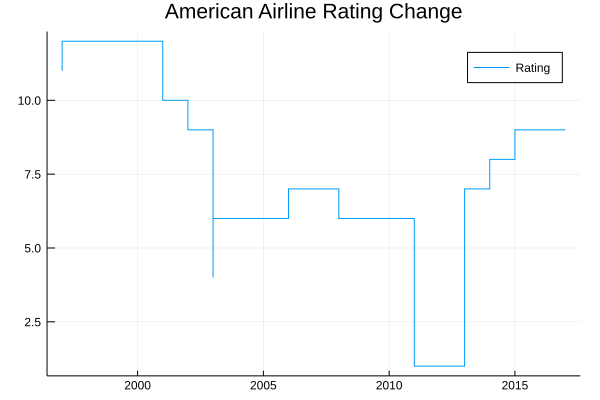

In [46]:
# Select American Airline as the example
AAL = DataFrame(selected_data[selected_data.tic .=== "AAL",:]);
sort!(AAL,:datadate)
date = trunc.(Int, AAL.datadate / 10000)
plot(date, AAL.rating, label = "Rating", title = "American Airline Rating Change")

In [47]:
savefig("AAL_rating.png")

### 3.3 Single Notch Tansitions, Multiple Notch Transitions Percentage

Calculate the percentage of single notch change and multiple notch change

### 3.3.1 Per Company (transitioning between months)

In [48]:
part1_transition_df_with_year_transition = DataFrame(company = String[], singlenotch = Int[], multinotch = Int[], perctmultinotch = Float64[]);
part1_transition_df_without_year_transition = DataFrame(company = String[], singlenotch = Int[], multinotch = Int[], perctmultinotch = Float64[]);
multiple_notch_counter = 0;
single_notch_counter = 0;

<p style='text-align: justify;'>
The code below counts the transition between each month, including any transition inbetween years.

In [49]:
for subgroup in groupby(selected_data, :gvkey)
    subgroup = sort(subgroup,:datadate)
    temp_rating = subgroup.rating
    previous = temp_rating[1]
    multiple_notch_counter = 0
    single_notch_counter = 0
    for i in 2:size(temp_rating,1)
        if abs(temp_rating[i] - previous) > 1
            multiple_notch_counter = multiple_notch_counter + 1
        elseif abs(temp_rating[i] - previous) == 1
            single_notch_counter = single_notch_counter + 1
        end
        previous = temp_rating[i]
    end
    perct = multiple_notch_counter / (single_notch_counter + multiple_notch_counter)
    name = subgroup.tic[1]
    push!(part1_transition_df_with_year_transition, [name, single_notch_counter, multiple_notch_counter, perct])
end
part1_transition_df_with_year_transition

,company,singlenotch,multinotch,perctmultinotch
,String,Int64,Int64,Float64
1,0141A,6,3,0.3333
2,0176A,2,0,0.0000
3,0191A,4,6,0.6000
4,1231B,7,3,0.3000
5,3NSRGY,0,1,1.0000
6,5672A,3,0,0.0000
7,5946B,6,2,0.2500
8,6120B,5,2,0.2857
9,8135A,8,0,0.0000


In [50]:
println(sum(part1_transition_df_with_year_transition[:,2]))
println(sum(part1_transition_df_with_year_transition[:,3]))

2099
502


<p style='text-align: justify;'>
This code below counts the transition within the year, excluding cross-year transition; as it turns out, ratings change quite a lot transitioning between years. 

In [51]:
part2_data = selected_data;
temp_year = trunc.(Int, (part2_data.datadate ./ 10000));
year = DataFrame();
year = hcat(year, temp_year);
rename!(year, :x1 => :year);
part2_data = hcat(part2_data, year)

,gvkey,datadate,gsector,conm,tic,rating,year
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰,Int64,Int64
1,2316,20061031,15,HEXION INC,0141A,7,2006
2,2316,20061130,15,HEXION INC,0141A,7,2006
3,2316,20061231,15,HEXION INC,0141A,7,2006
4,2316,20070131,15,HEXION INC,0141A,7,2007
5,2316,20070228,15,HEXION INC,0141A,7,2007
6,2316,20070331,15,HEXION INC,0141A,7,2007
7,2316,20070430,15,HEXION INC,0141A,7,2007
8,2316,20070531,15,HEXION INC,0141A,7,2007
9,2316,20070630,15,HEXION INC,0141A,7,2007


In [52]:
for subgroup in groupby(part2_data, :gvkey)
    subgroup = sort(subgroup,:datadate)
    temp_rating = subgroup.rating
    temp_year = subgroup.year
    previous = temp_rating[1]
    previous_year = temp_year[1]
    multiple_notch_counter = 0
    single_notch_counter = 0
    for i in 2:size(temp_rating,1)
        if abs(temp_rating[i] - previous) > 1 && temp_year[i] == previous_year
            multiple_notch_counter = multiple_notch_counter + 1
        elseif abs(temp_rating[i] - previous) == 1 && temp_year[i] == previous_year
            single_notch_counter = single_notch_counter + 1
        end
        previous = temp_rating[i]
        previous_year = temp_year[i]
    end
    perct = multiple_notch_counter / (single_notch_counter + multiple_notch_counter)
    name = subgroup.tic[1]
    push!(part1_transition_df_without_year_transition, [name, single_notch_counter, multiple_notch_counter, perct])
end
part1_transition_df_without_year_transition

,company,singlenotch,multinotch,perctmultinotch
,String,Int64,Int64,Float64
1,0141A,5,3,0.3750
2,0176A,1,0,0.0000
3,0191A,4,6,0.6000
4,1231B,6,3,0.3333
5,3NSRGY,0,1,1.0000
6,5672A,3,0,0.0000
7,5946B,6,2,0.2500
8,6120B,5,2,0.2857
9,8135A,8,0,0.0000


In [53]:
println(sum(part1_transition_df_without_year_transition[:,2]))
println(sum(part1_transition_df_without_year_transition[:,3]))

1963
468


### 3.3.2 Over time, Per year

In [54]:
part2_transition_df_without_year_transition = DataFrame(year = Int[1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017], singlenotch = Int[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], multinotch = Int[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], perctmultinotch = Float64[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]);
part2_transition_df_with_year_transition = DataFrame(year = Int[1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017], singlenotch = Int[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], multinotch = Int[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], perctmultinotch = Float64[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]);
overtime_multinotch_counter = 0;
overtime_singlenotch_counter = 0;

For easier processing, create a column of the year

In [55]:
# Still use tic as the separating factor, then slowly accumulate the counter
for subgroup in groupby(part2_data, :gvkey)
    subgroup = sort(subgroup,:datadate)
    temp_data = DataFrame(subgroup)
    counter = 1
    for subtime in groupby(temp_data, :year)
        temp_rating = subtime.rating
        previous = temp_rating[1]
        overtime_multinotch_counter = 0
        overtime_singlenotch_counter = 0
        for i in 2:size(temp_rating,1)
            if abs(temp_rating[i] - previous) > 1
                overtime_multinotch_counter = overtime_multinotch_counter + 1
            elseif abs(temp_rating[i] - previous) == 1
                overtime_singlenotch_counter = overtime_singlenotch_counter + 1
            end
            previous = temp_rating[i]
        end
        part2_transition_df_without_year_transition[counter,2] = part2_transition_df_without_year_transition[counter,2] + overtime_singlenotch_counter
        part2_transition_df_without_year_transition[counter,3] = part2_transition_df_without_year_transition[counter,3] + overtime_multinotch_counter
        counter = counter + 1
    end
end
part2_transition_df_without_year_transition.perctmultinotch = part2_transition_df_without_year_transition.multinotch ./ (part2_transition_df_without_year_transition.multinotch + part2_transition_df_without_year_transition.singlenotch)
part2_transition_df_without_year_transition

,year,singlenotch,multinotch,perctmultinotch
,Int64,Int64,Int64,Float64
1,1997,84,9,0.0968
2,1998,90,17,0.1589
3,1999,83,22,0.2095
4,2000,75,33,0.3056
5,2001,87,36,0.2927
6,2002,117,38,0.2452
7,2003,113,29,0.2042
8,2004,72,14,0.1628
9,2005,103,16,0.1345


In [56]:
println(sum(part2_transition_df_without_year_transition[:,2]))
println(sum(part2_transition_df_without_year_transition[:,3]))

1963
468


In [57]:
# Testing ground 
for subgroup in groupby(part2_data, :gvkey)
    subgroup = sort(subgroup,:datadate)
    A = subgroup[subgroup.year .=== 2017,:]
    println(A)
    break
end

2×7 DataFrame
│ Row │ gvkey  │ datadate │ gsector │ conm       │ tic     │ rating │ year  │
│     │ Int64⍰ │ Int64⍰   │ Int64⍰  │ String⍰    │ String⍰ │ Int64  │ Int64 │
├─────┼────────┼──────────┼─────────┼────────────┼─────────┼────────┼───────┤
│ 1   │ 2316   │ 20170131 │ 15      │ HEXION INC │ 0141A   │ 5      │ 2017  │
│ 2   │ 2316   │ 20170228 │ 15      │ HEXION INC │ 0141A   │ 5      │ 2017  │


<p style='text-align: justify;'>
To include the cross-year transitions into the next year's transition: for example, 1997 Dec => 1998 Jan, there is a single notch rating change, it will be recorded as a 1998 transition, not 1997 transition. 

In [58]:
for subgroup in groupby(part2_data, :gvkey)
    subgroup = sort(subgroup,:datadate)
    temp_data = DataFrame(subgroup)
    counter = 1
    init_flag = 0
    previous_year = 0
    for subtime in groupby(temp_data, :year)
        temp_rating = subtime.rating
        previous = temp_rating[1]
        overtime_multinotch_counter = 0
        overtime_singlenotch_counter = 0
        
        if init_flag == 0
            previous_year = temp_rating[end]
        elseif init_flag == 1
            if abs(previous - previous_year) > 1
                overtime_multinotch_counter = overtime_multinotch_counter + 1
            elseif abs(previous - previous_year) == 1
                overtime_singlenotch_counter = overtime_singlenotch_counter + 1
            end
            previous_year = temp_rating[end]
        end
            
        for i in 2:size(temp_rating,1)
            if abs(temp_rating[i] - previous) > 1
                overtime_multinotch_counter = overtime_multinotch_counter + 1
            elseif abs(temp_rating[i] - previous) == 1
                overtime_singlenotch_counter = overtime_singlenotch_counter + 1
            end
            previous = temp_rating[i]
        end
        part2_transition_df_with_year_transition[counter,2] = part2_transition_df_with_year_transition[counter,2] + overtime_singlenotch_counter
        part2_transition_df_with_year_transition[counter,3] = part2_transition_df_with_year_transition[counter,3] + overtime_multinotch_counter
        counter = counter + 1
        init_flag = 1
    end
end
part2_transition_df_with_year_transition.perctmultinotch = part2_transition_df_with_year_transition.multinotch ./ (part2_transition_df_with_year_transition.multinotch + part2_transition_df_with_year_transition.singlenotch)
part2_transition_df_with_year_transition

,year,singlenotch,multinotch,perctmultinotch
,Int64,Int64,Int64,Float64
1,1997,84,9,0.0968
2,1998,98,17,0.1478
3,1999,94,24,0.2034
4,2000,81,36,0.3077
5,2001,98,40,0.2899
6,2002,126,40,0.2410
7,2003,118,31,0.2081
8,2004,79,14,0.1505
9,2005,107,16,0.1301


In [59]:
println(sum(part2_transition_df_with_year_transition[:,2]))
println(sum(part2_transition_df_with_year_transition[:,3]))

2099
502


<p style='text-align: justify;'>
Note that the sum checks for 3.3.1 and 3.3.2 (without year and with year transition) match perfectly

### 3.4 Transition Probability

<p style='text-align: justify;'>
Transition probabilities are calculated by year, so we can see how the transition probabilties grow over the years. The following calculation is without cross-year transitions. Incorporating cross-year transition proves to be problematic. 

In [60]:
transition_matrix_array = [];

In [61]:
transition_data = selected_data;
temp_month = trunc.(Int, (transition_data.datadate - (trunc.(Int, (transition_data.datadate ./ 10000)) * 10000)) ./ 100);
month = DataFrame();
month = hcat(year, temp_month);
rename!(month, :x1 => :month);
transition_data = hcat(transition_data, month)

,gvkey,datadate,gsector,conm,tic,rating,year,month
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰,Int64,Int64,Int64
1,2316,20061031,15,HEXION INC,0141A,7,2006,10
2,2316,20061130,15,HEXION INC,0141A,7,2006,11
3,2316,20061231,15,HEXION INC,0141A,7,2006,12
4,2316,20070131,15,HEXION INC,0141A,7,2007,1
5,2316,20070228,15,HEXION INC,0141A,7,2007,2
6,2316,20070331,15,HEXION INC,0141A,7,2007,3
7,2316,20070430,15,HEXION INC,0141A,7,2007,4
8,2316,20070531,15,HEXION INC,0141A,7,2007,5
9,2316,20070630,15,HEXION INC,0141A,7,2007,6


In [62]:
# Storing data into a total transition matrix just in case
total_transition_matrix = DataFrame()
# A quick creation of transition matrix using for loop
for i in 1:21
    temp = Array([0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])
    total_transition_matrix = hcat(total_transition_matrix, temp)
end
rename!(total_transition_matrix, Dict(:x1 => Symbol("D/SD"), :x1_1 => Symbol("CC"), :x1_2 => Symbol("CCC-"), :x1_3 => Symbol("CCC"), :x1_4 => Symbol("CCC+"), :x1_5 => Symbol("B-"), :x1_6 => Symbol("B"), :x1_7 => Symbol("B+"), :x1_8 => Symbol("BB-"), :x1_9 => Symbol("BB"), :x1_10 => Symbol("BB+"), :x1_11 => Symbol("BBB-"), :x1_12 => Symbol("BBB"), :x1_13 => Symbol("BBB+"), :x1_14 => Symbol("A-"), :x1_15 => Symbol("A"), :x1_16 => Symbol("A+"), :x1_17 => Symbol("AA-"), :x1_18 => Symbol("AA"), :x1_19 => Symbol("AA+"), :x1_20 => Symbol("AAA")));

In [63]:
summation = 0
sort!(transition_data,:datadate)
for subtime in groupby(transition_data, :year)
    subtime = sort(subtime, :datadate)
    temp_data = DataFrame(subtime)
    
    transition_matrix = DataFrame()
    for i in 1:21
        temp = Array([0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])
        transition_matrix = hcat(transition_matrix, temp)
    end
    rename!(transition_matrix, Dict(:x1 => Symbol("D/SD"), :x1_1 => Symbol("CC"), :x1_2 => Symbol("CCC-"), :x1_3 => Symbol("CCC"), :x1_4 => Symbol("CCC+"), :x1_5 => Symbol("B-"), :x1_6 => Symbol("B"), :x1_7 => Symbol("B+"), :x1_8 => Symbol("BB-"), :x1_9 => Symbol("BB"), :x1_10 => Symbol("BB+"), :x1_11 => Symbol("BBB-"), :x1_12 => Symbol("BBB"), :x1_13 => Symbol("BBB+"), :x1_14 => Symbol("A-"), :x1_15 => Symbol("A"), :x1_16 => Symbol("A+"), :x1_17 => Symbol("AA-"), :x1_18 => Symbol("AA"), :x1_19 => Symbol("AA+"), :x1_20 => Symbol("AAA")))
    for subgroup in groupby(temp_data, :gvkey)
        temp_rating = subgroup.rating
        previous = temp_rating[1]
        
        for i in 2:size(temp_rating,1)
            transition_matrix[previous,temp_rating[i]] += 1
            total_transition_matrix[previous,temp_rating[i]] += 1
            previous = temp_rating[i]
        end
    end
    
    # Add to the transition_matrix_array
    push!(transition_matrix_array, transition_matrix) 
end
size(transition_matrix_array,1)

21

In [64]:
total_transition_matrix

,D/SD,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,202,0,0,2,4,0,7,0,1,1,0,1,0,0,0,0,0,0,0,0,0
2,5,28,1,1,2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,2,68,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,3,5,0,101,5,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,2,2,2,6,383,16,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,2,1,0,7,19,1092,24,7,2,0,0,0,1,0,0,0,0,0,0,0,0
7,1,2,1,2,3,29,2232,40,7,0,0,0,0,0,0,0,0,0,0,0,0
8,0,1,0,1,2,11,51,2761,50,7,1,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,5,7,53,3694,53,11,0,0,0,0,0,0,0,0,0,0


In [65]:
transition_matrix_array[7]

,D/SD,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,30,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,4,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,19,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,2,1,40,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,1,0,1,0,46,2,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,4,142,2,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,2,1,5,213,4,0,0,0,0,0,0,0,0,0,0,0


In [66]:
# Testing ground
result = 0
transition = []
for i in 1:21
    for row in 1:size(transition_matrix_array[i],1)
        for column in 1:size(transition_matrix_array[i],1)
            if row != column
                result += transition_matrix_array[i][row,column]
            end
        end
    end
    push!(transition, result)
    result = 0
end
transition

21-element Array{Any,1}:
  93
 107
 105
 108
 123
 155
 142
  86
 119
 123
 139
 151
 163
 121
 133
 109
 115
  92
 114
 123
  10

<p style='text-align: justify;'>
The result above matches the transition numbers without cross-year transitions found in prvious section

In [67]:
total_transition_probability_matrix = DataFrame(x1 = [], x1_1 = [], x1_2 = [], x1_3 = [], x1_4 = [], x1_5 = [], x1_6 = [], x1_7 = [], x1_8 = [], x1_9 = [], x1_10 = [], x1_11 = [], x1_12 = [], x1_13 = [], x1_14 = [], x1_15 = [], x1_16 = [], x1_17 = [], x1_18 = [], x1_19 = [], x1_20 = []);
rename!(total_transition_probability_matrix, Dict(:x1 => Symbol("D/SD"), :x1_1 => Symbol("CC"), :x1_2 => Symbol("CCC-"), :x1_3 => Symbol("CCC"), :x1_4 => Symbol("CCC+"), :x1_5 => Symbol("B-"), :x1_6 => Symbol("B"), :x1_7 => Symbol("B+"), :x1_8 => Symbol("BB-"), :x1_9 => Symbol("BB"), :x1_10 => Symbol("BB+"), :x1_11 => Symbol("BBB-"), :x1_12 => Symbol("BBB"), :x1_13 => Symbol("BBB+"), :x1_14 => Symbol("A-"), :x1_15 => Symbol("A"), :x1_16 => Symbol("A+"), :x1_17 => Symbol("AA-"), :x1_18 => Symbol("AA"), :x1_19 => Symbol("AA+"), :x1_20 => Symbol("AAA")));
for row = 1:size(total_transition_matrix,1)
    temp_row = convert(Array, total_transition_matrix[row,:]) / sum(convert(Array, total_transition_matrix[row,:]))
    push!(total_transition_probability_matrix, temp_row)
end
total_transition_probability_matrix

,D/SD,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,0.9266,0.0000,0.0000,0.0092,0.0183,0.0000,0.0321,0.0000,0.0046,0.0046,0.0000,0.0046,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.1282,0.7179,0.0256,0.0256,0.0513,0.0256,0.0256,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.0137,0.0274,0.9315,0.0000,0.0137,0.0137,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.0252,0.0420,0.0000,0.8487,0.0420,0.0420,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.0048,0.0048,0.0048,0.0145,0.9229,0.0386,0.0096,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.0017,0.0009,0.0000,0.0061,0.0165,0.9455,0.0208,0.0061,0.0017,0.0000,0.0000,0.0000,0.0009,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.0004,0.0009,0.0004,0.0009,0.0013,0.0125,0.9633,0.0173,0.0030,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.0000,0.0003,0.0000,0.0003,0.0007,0.0038,0.0177,0.9570,0.0173,0.0024,0.0003,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.0000,0.0000,0.0000,0.0000,0.0000,0.0013,0.0018,0.0139,0.9663,0.0139,0.0029,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


<p style='text-align: justify;'>
Each transition matrix in the transition matrix array can be swapped into transition probability matrix using the same conversion process shown above.

In [68]:
transition_probability_matrix_array = []
for year = 1:size(transition_matrix_array,1)
    temp_transition_probability_matrix = DataFrame(x1 = [], x1_1 = [], x1_2 = [], x1_3 = [], x1_4 = [], x1_5 = [], x1_6 = [], x1_7 = [], x1_8 = [], x1_9 = [], x1_10 = [], x1_11 = [], x1_12 = [], x1_13 = [], x1_14 = [], x1_15 = [], x1_16 = [], x1_17 = [], x1_18 = [], x1_19 = [], x1_20 = []);
    rename!(temp_transition_probability_matrix, Dict(:x1 => Symbol("D/SD"), :x1_1 => Symbol("CC"), :x1_2 => Symbol("CCC-"), :x1_3 => Symbol("CCC"), :x1_4 => Symbol("CCC+"), :x1_5 => Symbol("B-"), :x1_6 => Symbol("B"), :x1_7 => Symbol("B+"), :x1_8 => Symbol("BB-"), :x1_9 => Symbol("BB"), :x1_10 => Symbol("BB+"), :x1_11 => Symbol("BBB-"), :x1_12 => Symbol("BBB"), :x1_13 => Symbol("BBB+"), :x1_14 => Symbol("A-"), :x1_15 => Symbol("A"), :x1_16 => Symbol("A+"), :x1_17 => Symbol("AA-"), :x1_18 => Symbol("AA"), :x1_19 => Symbol("AA+"), :x1_20 => Symbol("AAA")));
    for row = 1:size(transition_matrix_array[year],1)
        temp_row = convert(Array, transition_matrix_array[year][row,:]) / sum(convert(Array, transition_matrix_array[year][row,:]))
        if sum(convert(Array, transition_matrix_array[year][row,:])) == 0
            temp_row = Array([0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000])
        end
        push!(temp_transition_probability_matrix, temp_row)
    end
    push!(transition_probability_matrix_array, temp_transition_probability_matrix)
end

In [69]:
transition_probability_matrix_array[6]

,D/SD,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,0.8333,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1667,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.2500,0.0000,0.0000,0.7500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.0000,0.0000,0.0000,0.0000,0.7500,0.0000,0.2500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.0143,0.0000,0.0000,0.0143,0.0000,0.0286,0.9286,0.0000,0.0143,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0253,0.9620,0.0127,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0105,0.9895,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


### 3.5 Stationary Distribution

<p style='text-align: justify;'>
Since we can have the transition matrix, we can find the stationary distribution; since the yearly transition probability matrix is too sparse, the total transition probability matrix is used

In [70]:
M = convert(Array, total_transition_probability_matrix) - Matrix{Float64}(I, 21, 21);
M[:,1] = ones(21);
stationary_distribution = DataFrame([1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] * inv(M))
rename!(stationary_distribution, Dict(:x1 => Symbol("D/SD"), :x2 => Symbol("CC"), :x3 => Symbol("CCC-"), :x4 => Symbol("CCC"), :x5 => Symbol("CCC+"), :x6 => Symbol("B-"), :x7 => Symbol("B"), :x8 => Symbol("B+"), :x9 => Symbol("BB-"), :x10 => Symbol("BB"), :x11 => Symbol("BB+"), :x12 => Symbol("BBB-"), :x13 => Symbol("BBB"), :x14 => Symbol("BBB+"), :x15 => Symbol("A-"), :x16 => Symbol("A"), :x17 => Symbol("A+"), :x18 => Symbol("AA-"), :x19 => Symbol("AA"), :x20 => Symbol("AA+"), :x21 => Symbol("AAA")))

,D/SD,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0067,0.0015,0.0020,0.0041,0.0148,0.0372,0.0688,0.0634,0.0762,0.0802,0.0744,0.1344,0.1927,0.1303,0.0699,0.0333,0.0080,0.0017,0.0003,0.0000,0.0000


## 4. Sector

<p style='text-align: justify;'>
For this section, we will discuss about the single and multi notch and transition matrix based on the sector. The reason why we use sector is because we want discuss the credit rating among different sectors. We will use the same data file as the second section does. There are totally 11 unique sector based on the data set we use.

### 4.1 Data Processing

In [71]:
raw_data = readtable("data.csv");
data = dropmissing(raw_data);

In [72]:
sector = unique(data.gsector)
print("Number of Unique Sector: ", size(sector, 1), "\n")
print("Unique Sector: ", "\n", sort(sector))

Number of Unique Sector: 11
Unique Sector: 
Union{Missing, Int64}[10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]

In [73]:
sector_10 = data[data[:4] .== 10,:]
sector_15 = data[data[:4] .== 15,:]
sector_20 = data[data[:4] .== 20,:]
sector_25 = data[data[:4] .== 25,:]
sector_30 = data[data[:4] .== 30,:]
sector_35 = data[data[:4] .== 35,:]
sector_40 = data[data[:4] .== 40,:]
sector_45 = data[data[:4] .== 45,:]
sector_50 = data[data[:4] .== 50,:]
sector_55 = data[data[:4] .== 55,:]
sector_60 = data[data[:4] .== 60,:]

sector_dict = Dict("sector_10"=>sector_10,"sector_15"=>sector_15,"sector_20"=>sector_20,"sector_25"=>sector_25,"sector_30"=>sector_30,"sector_35"=>sector_35,"sector_40"=>sector_40,"sector_45"=>sector_45,"sector_50"=>sector_50,"sector_55"=>sector_55,"sector_60"=>sector_60)

Dict{String,DataFrame} with 11 entries:
  "sector_10" => 60689×6 DataFrame. Omitted printing of 1 columns…
  "sector_35" => 39882×6 DataFrame. Omitted printing of 1 columns…
  "sector_20" => 93300×6 DataFrame…
  "sector_30" => 42590×6 DataFrame. Omitted printing of 1 columns…
  "sector_60" => 17543×6 DataFrame. Omitted printing of 1 columns…
  "sector_55" => 85314×6 DataFrame. Omitted printing of 1 columns…
  "sector_15" => 61993×6 DataFrame. Omitted printing of 1 columns…
  "sector_50" => 41973×6 DataFrame. Omitted printing of 2 columns…
  "sector_25" => 109659×6 DataFrame. Omitted printing of 1 columns…
  "sector_45" => 41830×6 DataFrame…
  "sector_40" => 106484×6 DataFrame. Omitted printing of 1 columns…

In [74]:
head(sector_dict["sector_60"])

,gvkey,splticrm,datadate,gsector,conm,tic
,Int64⍰,String⍰,Int64⍰,Int64⍰,String⍰,String⍰
1,1257,BB-,19851231,60,ALEXANDER'S INC,ALX
2,1257,BB-,19860131,60,ALEXANDER'S INC,ALX
3,1257,BB-,19860228,60,ALEXANDER'S INC,ALX
4,1257,BB-,19860331,60,ALEXANDER'S INC,ALX
5,1257,BB-,19860430,60,ALEXANDER'S INC,ALX
6,1257,BB-,19860531,60,ALEXANDER'S INC,ALX


<p style='text-align: justify;'>
Here, we group the data by 11 sectors and encode the string credit ratings into numerical credit ratings.

In [75]:
sector_data_dict = Dict()
for sector in ["sector_10","sector_15","sector_20","sector_25", "sector_30","sector_35","sector_40", "sector_45", "sector_50","sector_55","sector_60"]
    sector_data = sector_dict[sector]
    #take out the gvkey
    gvkey=unique(sector_data[:1])    
    #join all companies into dataframe
    all_data=DataFrame(datadate=0)
    for itr in enumerate(gvkey)
        #println(itr[2])
        temp1=sector_data[sector_data[:1].==itr[2],:][2:3]
        all_data=join(all_data,temp1,on= :datadate, kind= :outer,makeunique = true)
    end
    key = sector*"_data"
    sector_data_dict[key] = all_data[2:end,:]
    colnames = vcat(["datadate"],gvkey)
    names!(sector_data_dict[key],Symbol.(colnames))
end

In [76]:
head(sector_data_dict["sector_60_data"])

,datadate,1257,4605,4842,5149,5543,5862,7063,8363,8692,8824,10096,10894,11220,11301,11340,11456,12140,13125,13510,13562,13579,15142,15637,16116,17556,18145,18296,18383,18573,18700,18792,19507,19582,19800,20344,21630,22405,23077,23793,24010,24533,24620,24731,24825,25600,25632,25633,25950,27045,27780,27800,28119,28322,28340,28608,28629,28733,29052,29082,29099,29359,29389,29649,29875,29984,30293,30298,30354,30384,30490,30495,30536,30637,30822,31717,60914,61163,61188,62374,63422,64306,64821,64925,65084,65108,65290,65632,65710,66354,105365,108071,110179,110382,113490,121382,124046,138743,141158,146140,157679,160990,160991,161048,161953,162160,163963,164132,170375,174022,176268,178539,178610,179077,179707,182701,183312,185018,185549,185618,185797,186783,187690,260996,266315
,Int64⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰,String⍰
1,19851231,BB-,missing,missing,B+,missing,A,A-,missing,BBB+,D,missing,missing,missing,missing,missing,A+,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing
2,19860131,BB-,missing,missing,B+,missing,A,A-,missing,BBB+,D,missing,missing,missing,missing,missing,A+,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing
3,19860228,BB-,missing,missing,B+,missing,A,A-,missing,BBB+,D,missing,missing,missing,missing,missing,A+,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,mi

In [77]:
numerical_data_dict = Dict()
for sector in ["sector_10","sector_15","sector_20","sector_25", "sector_30","sector_35","sector_40", "sector_45", "sector_50","sector_55","sector_60"]
    key = sector*"_data"
    sector_data = sector_data_dict[key]
    data=DataFrame()
    for j in 2:size(sector_data)[2]
        temp=[]
        for k in 1:size(sector_data)[1]
            if ismissing(sector_data[j][k])
                append!(temp,-2)
            elseif sector_data[j][k]=="AAA"
                append!(temp,23)
            elseif sector_data[j][k]=="AA+"
                append!(temp,22)
            elseif sector_data[j][k]=="AA"
                append!(temp,21)
            elseif sector_data[j][k]=="AA-"
                append!(temp,20)
            elseif sector_data[j][k]=="A+"
                append!(temp,19)
            elseif sector_data[j][k]=="A"
                append!(temp,18)
            elseif sector_data[j][k]=="A-"
                append!(temp,17)
            elseif sector_data[j][k]=="BBB+"
                append!(temp,16)
            elseif sector_data[j][k]=="BBB"
                append!(temp,15)
            elseif sector_data[j][k]=="BBB-"
                append!(temp,14)
            elseif sector_data[j][k]=="BB+"
                append!(temp,13)
            elseif sector_data[j][k]=="BB"
                append!(temp,12)
            elseif sector_data[j][k]=="BB-"
                append!(temp,11)
            elseif sector_data[j][k]=="B+"
                append!(temp,10)
            elseif sector_data[j][k]=="B"
                append!(temp,9)
            elseif sector_data[j][k]=="B-"
                append!(temp,8)
            elseif sector_data[j][k]=="CCC+"
                append!(temp,7)
            elseif sector_data[j][k]=="CCC"
                append!(temp,6)
            elseif sector_data[j][k]=="CCC-"
                append!(temp,5)
            elseif sector_data[j][k]=="CC"
                append!(temp,4)
            elseif sector_data[j][k]=="C"
                append!(temp,3)
            elseif sector_data[j][k]=="SD"
                append!(temp,2)
            elseif sector_data[j][k]=="D"
                append!(temp,2)
            elseif sector_data[j][k]=="N.M."
                append!(temp, 0)
            else
                append!(temp, 0)
            end

        end

        data=hcat(data,temp,makeunique = true)
    end
    sector_data = sector_dict[sector]
    gvkey=unique(sector_data[:1])
    names!(data,Symbol.(gvkey))
    key_new = sector*"_num"
    numerical_data_dict[key_new] = data
end

In [78]:
head(numerical_data_dict["sector_60_num"])

,1257,4605,4842,5149,5543,5862,7063,8363,8692,8824,10096,10894,11220,11301,11340,11456,12140,13125,13510,13562,13579,15142,15637,16116,17556,18145,18296,18383,18573,18700,18792,19507,19582,19800,20344,21630,22405,23077,23793,24010,24533,24620,24731,24825,25600,25632,25633,25950,27045,27780,27800,28119,28322,28340,28608,28629,28733,29052,29082,29099,29359,29389,29649,29875,29984,30293,30298,30354,30384,30490,30495,30536,30637,30822,31717,60914,61163,61188,62374,63422,64306,64821,64925,65084,65108,65290,65632,65710,66354,105365,108071,110179,110382,113490,121382,124046,138743,141158,146140,157679,160990,160991,161048,161953,162160,163963,164132,170375,174022,176268,178539,178610,179077,179707,182701,183312,185018,185549,185618,185797,186783,187690,260996,266315
,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,11,-2,-2,10,-2,18,17,-2,16,2,-2,-2,-2,-2,-2,19,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2
2,11,-2,-2,10,-2,18,17,-2,16,2,-2,-2,-2,-2,-2,19,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2
3,11,-2,-2,10,-2,18,17,-2,16,2,-2,-2,-2,-2,-2,19,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2
4,11,18,-2,10,-2,18,17,-2,16,2,-2,-2,-2,-2,-2,19,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2
5,11,18,-2,10,-2,18,17,-2,16,2,-2,-2,-2,-2,-2,19,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2
6,11,18,-2,10,-2,18,17,-2,16,2,-2,-2,-2,-2,-2,19,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2


### 4.2  Single Notch Tansitions, Multiple Notch Transitions Percentage

In [79]:
notch_dict = Dict()
for key in ["sector_10_num","sector_15_num","sector_20_num","sector_25_num","sector_30_num","sector_35_num","sector_40_num","sector_45_num","sector_50_num","sector_55_num","sector_60_num"]
    data = numerical_data_dict[key]
    sing_mult_notch=DataFrame(single=[],multi=[])
    sing_percentage=[]
    mult_percentage=[]
    for j in 1:size(data)[2]
        notch=[0,0]
        for k in 1:size(data)[1]-1
            if abs(data[k,j]-data[k+1,j])==1
                if data[k,j]!=-2 # missing = -2
                    notch[1] = notch[1]+1
                end
            elseif abs(data[k,j]-data[k+1,j])>1
                if data[k,j]!=-2 # missing = -2
                    notch[2] =notch[2]+1
                end            
            end
        end
        push!(sing_mult_notch,notch)
        append!(sing_percentage,notch[1]/sum(notch))
        append!(mult_percentage,notch[2]/sum(notch))
    end
    sing_mult_notch=hcat(sing_mult_notch,sing_percentage)
    sing_mult_notch=hcat(sing_mult_notch,mult_percentage,makeunique=true)
    rename!(sing_mult_notch,:x1,:single_percentage)
    rename!(sing_mult_notch,:x1_1,:multi_percentage)
    notch_dict[key] = sing_mult_notch
    print(key,"\n")
    println("single notch percentage: ",sum(sing_mult_notch[1])/(sum(sing_mult_notch[1])+sum(sing_mult_notch[2])))
    println("multi  notch percentage: ",1-sum(sing_mult_notch[1])/(sum(sing_mult_notch[1])+sum(sing_mult_notch[2])))
end

sector_10_num
single notch percentage: 0.4694
multi  notch percentage: 0.5306
sector_15_num
single notch percentage: 0.4305
multi  notch percentage: 0.5695
sector_20_num
single notch percentage: 0.4234
multi  notch percentage: 0.5766
sector_25_num
single notch percentage: 0.4699
multi  notch percentage: 0.5301
sector_30_num
single notch percentage: 0.4286
multi  notch percentage: 0.5714
sector_35_num
single notch percentage: 0.3987
multi  notch percentage: 0.6013
sector_40_num
single notch percentage: 0.4920
multi  notch percentage: 0.5080
sector_45_num
single notch percentage: 0.3708
multi  notch percentage: 0.6292
sector_50_num
single notch percentage: 0.3880
multi  notch percentage: 0.6120
sector_55_num
single notch percentage: 0.5590
multi  notch percentage: 0.4410
sector_60_num
single notch percentage: 0.7584
multi  notch percentage: 0.2416


<p style='text-align: justify;'>
The code above shows the single notch and multi notch percentage for each sector. We can easily see that the real estate industry, also known as the sector 60, has the highest single notch percentage 75.84%. On the other hand, the information technology industry, also known as the sector 45, has the lowest single notch percentage 37.08%. This phenomenon shows the property of each industry. The information technology industry is often considered as a more risky industry and thus the multi notch percentage is higher compared with other industries.

In [80]:
notch_dict["sector_60_num"]

,single,multi,single_percentage,multi_percentage
,Any,Any,Any,Any
1,0,1,0.0000,1.0000
2,5,1,0.8333,0.1667
3,3,3,0.5000,0.5000
4,1,1,0.5000,0.5000
5,2,0,1.0000,0.0000
6,6,2,0.7500,0.2500
7,8,2,0.8000,0.2000
8,0,1,0.0000,1.0000
9,8,0,1.0000,0.0000


### 4.3 Transition Probability

In [81]:
tran_mat_dict = Dict()
tran_prob_dict = Dict()
for key in ["sector_10_num","sector_15_num","sector_20_num","sector_25_num","sector_30_num","sector_35_num","sector_40_num","sector_45_num","sector_50_num","sector_55_num","sector_60_num"]
    data = numerical_data_dict[key]
    trans=zeros(23,23)
    trans2 = zeros(23,23)
    for j in 1:size(data)[2]
        for k in 1:size(data)[1]-1
            if data[k,j]>0 && data[k+1,j]>0
                trans[data[k,j],data[k+1,j]]=trans[data[k,j],data[k+1,j]]+1
            end
        end
    end
    transframe=DataFrame(trans)
    tran_mat_dict[key] = transframe
    for l in 1:22
        trans2[l,:]=trans[l,:]/sum(trans[l,:])
    end
    transframe2=DataFrame(trans2)
    tran_prob_dict[key] = transframe2
end

In [82]:
replace_nan(v) = map(x -> isnan(x) ? zero(x) : x, v)

replace_nan (generic function with 1 method)

In [83]:
tran_prob_dict["sector_60_num"] = map(replace_nan, eachcol(tran_prob_dict["sector_60_num"]))

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.0000,0.9756,0.0000,0.0244,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.0000,0.0270,0.0000,0.9189,0.0270,0.0270,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.0000,0.0000,0.0000,0.1111,0.7778,0.0000,0.1111,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.0000,0.0109,0.0000,0.0109,0.0000,0.9239,0.0109,0.0217,0.0109,0.0109,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.0000,0.0000,0.0000,0.0000,0.0256,0.0256,0.8974,0.0000,0.0256,0.0256,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.0000,0.0000,0.0000,0.0037,0.0000,0.0147,0.0000,0.9632,0.0184,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.0000,0.0000,0.0000,0.0000,0.0000,0.0020,0.0000,0.0099,0.9622,0.0219,0.0020,0.0020,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [84]:
head(tran_mat_dict["sector_60_num"])

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.0000,40.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.0000,1.0000,0.0000,34.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.0000,0.0000,0.0000,1.0000,7.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.0000,1.0000,0.0000,1.0000,0.0000,85.0000,1.0000,2.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [85]:
head(tran_prob_dict["sector_60_num"])

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.0000,0.9756,0.0000,0.0244,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.0000,0.0270,0.0000,0.9189,0.0270,0.0270,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.0000,0.0000,0.0000,0.1111,0.7778,0.0000,0.1111,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.0000,0.0109,0.0000,0.0109,0.0000,0.9239,0.0109,0.0217,0.0109,0.0109,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


<p style='text-align: justify;'>
Next, we try to visualize the transition matrix by exact times and probability. Take the sector 60 for example, there isn't any for data in the second row, which means there isn't any rating 2 (C) in this sector.